In [12]:
# Importar las librerías necesarias
# Dar acceso a Colab para acceder a los archivos del proyecto
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

#PUNTO 1
La calibración de cámara es esencial para cualquier aplicación de visión que requiera mediciones precisas o reconstrucción 3D. Permite:
- Corregir distorsiones de lente.
- Establecer la relación entre coordenadas del mundo real y píxeles.
- Obtener parámetros intrínsecos (matriz K, coeficientes de distorsión).







## Imágenes con las esquinas detectadas dibujadas

In [14]:
# Usar Google Colab para montar Google Drive
"""
from google.colab import drive
import glob
drive.mount('/content/drive')
images = glob.glob('/content/drive/Shareddrives/NeuroVision/Taller1/imagenes/calibracion/*.JPG')+ glob.glob('/content/drive/Shareddrives/NeuroVision/Taller1/imagenes/calibracion/*.jpg')
"""

from pathlib import Path

# La raíz será la carpeta donde está el notebook
ROOT = Path.cwd()
CALIB_DIR = ROOT / "imagenes" / "calibracion"

# Acepta .jpg y .jpeg en mayúsculas/minúsculas
patterns = ["*.[Jj][Pp][Gg]", "*.[Jj][Pp][Ee][Gg]"]
images = [p for pat in patterns for p in CALIB_DIR.glob(pat)]

print("Directorio:", CALIB_DIR)
print("Imágenes encontradas:", len(images))
# opcional: ver las primeras
print([str(p) for p in images[:5]])

Directorio: h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion
Imágenes encontradas: 21
['h:\\Proyectos\\UNAL\\ComputerVision\\taller_1_cv\\imagenes\\calibracion\\IMG_1555.JPG', 'h:\\Proyectos\\UNAL\\ComputerVision\\taller_1_cv\\imagenes\\calibracion\\IMG_1556.JPG', 'h:\\Proyectos\\UNAL\\ComputerVision\\taller_1_cv\\imagenes\\calibracion\\IMG_1557.JPG', 'h:\\Proyectos\\UNAL\\ComputerVision\\taller_1_cv\\imagenes\\calibracion\\IMG_1558.JPG', 'h:\\Proyectos\\UNAL\\ComputerVision\\taller_1_cv\\imagenes\\calibracion\\IMG_1559.JPG']


Imágenes encontradas: 21
h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1555.JPG


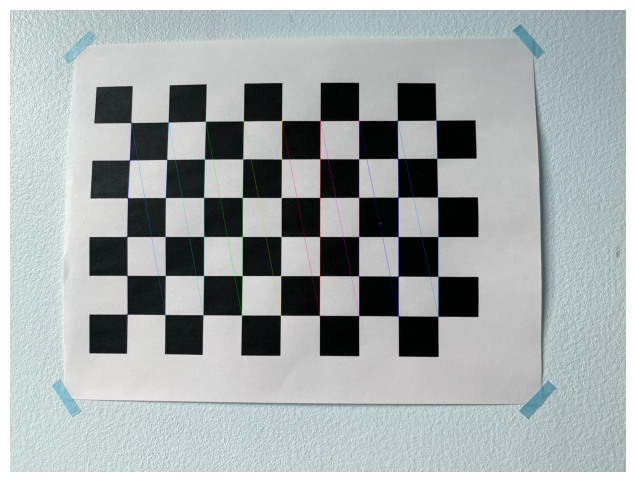

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1556.JPG


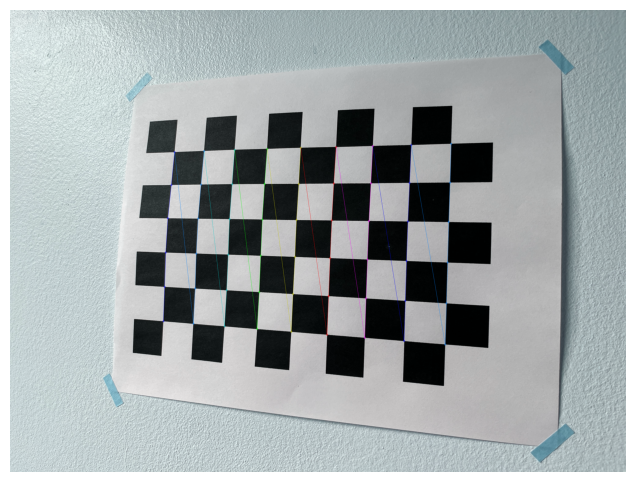

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1557.JPG


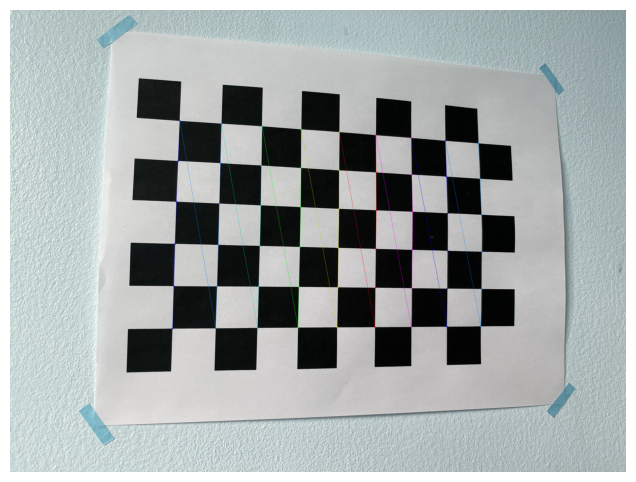

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1558.JPG


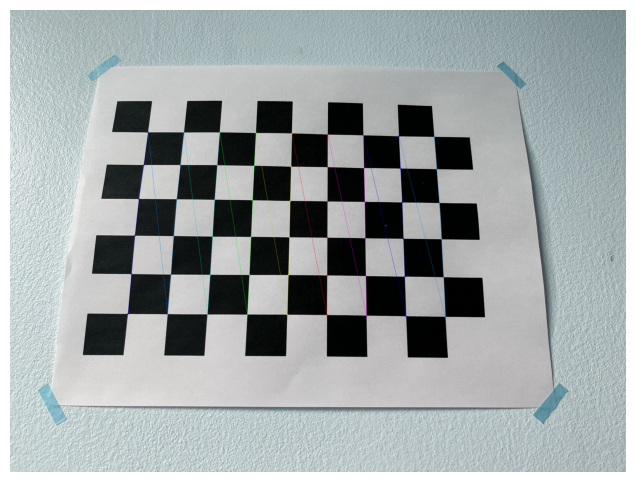

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1559.JPG


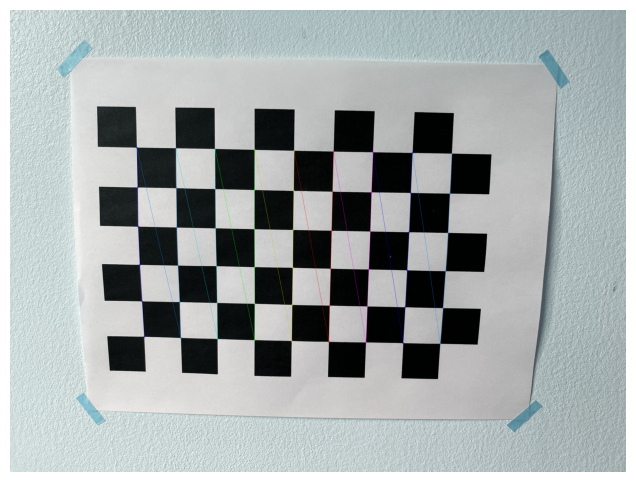

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1560.JPG


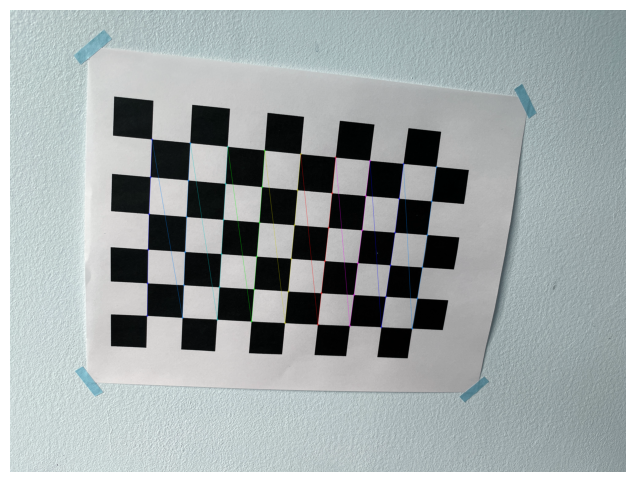

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1561.JPG


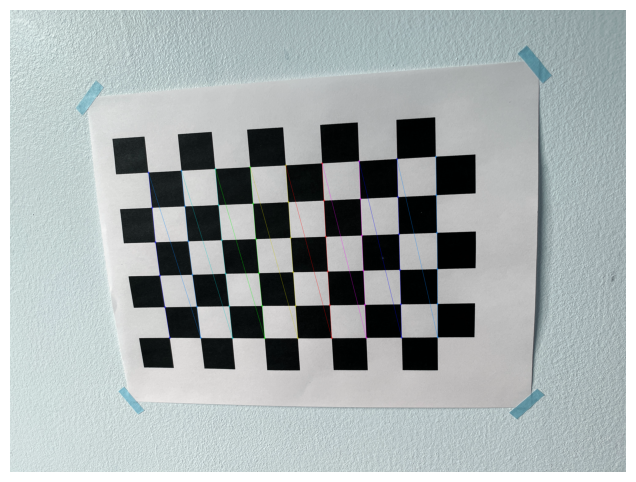

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1562(1).JPG


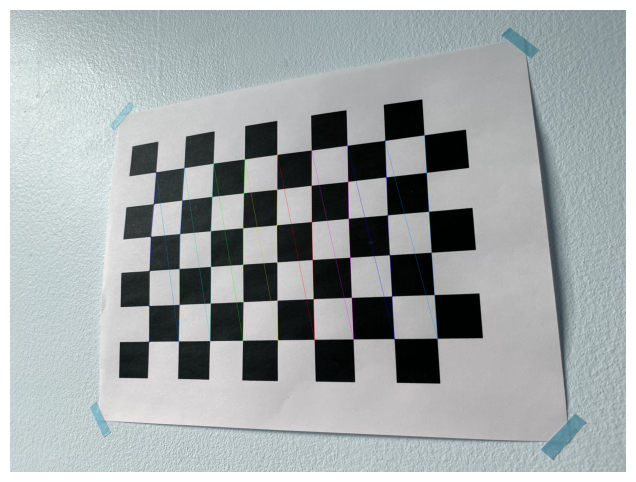

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1562.JPG


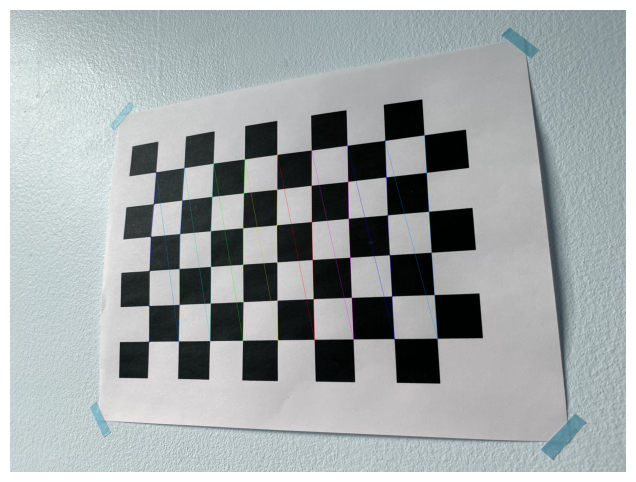

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1563(1).JPG


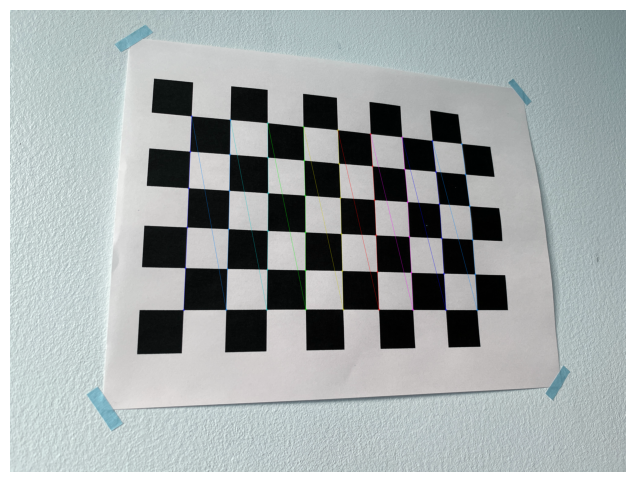

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1563.JPG


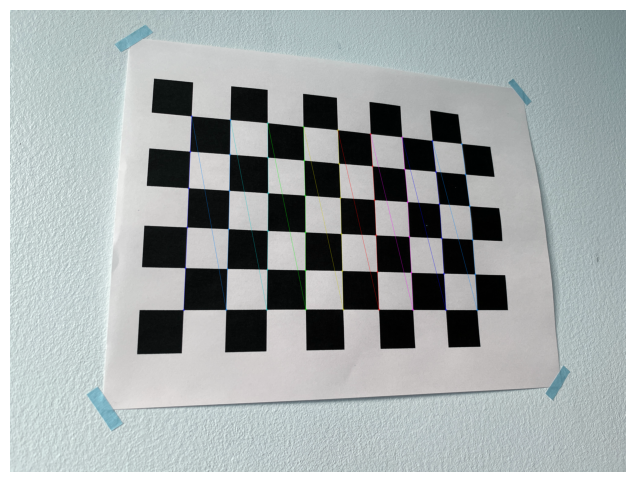

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1564.JPG


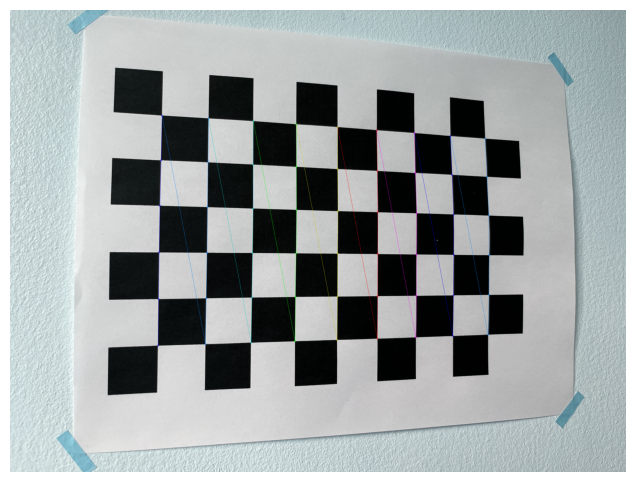

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1565.JPG


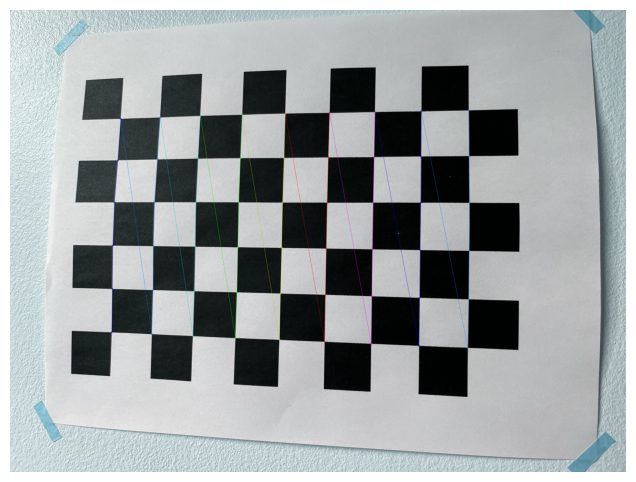

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1566.JPG


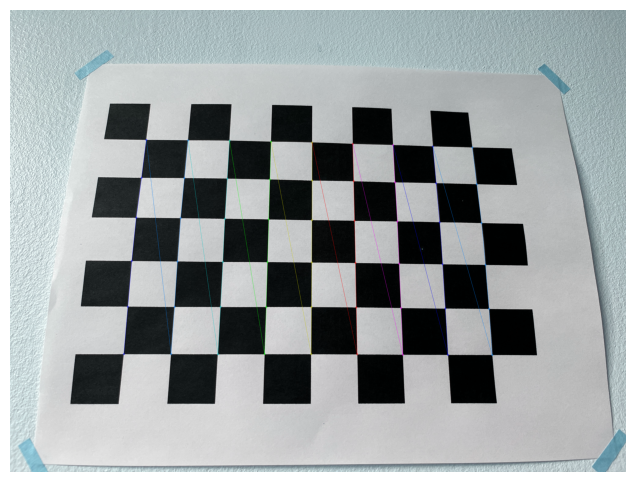

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1567.JPG


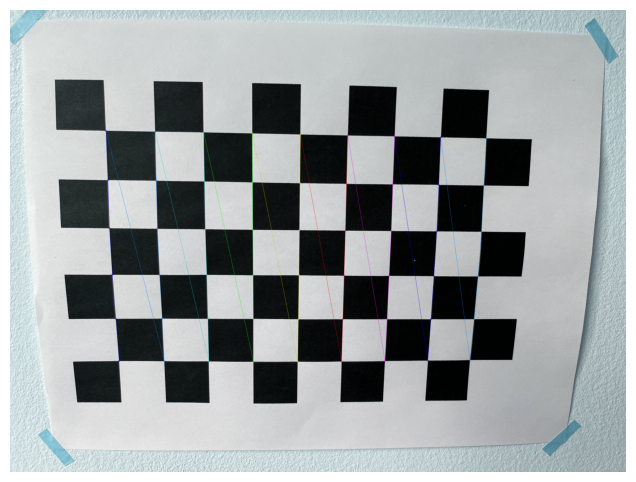

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1568.JPG


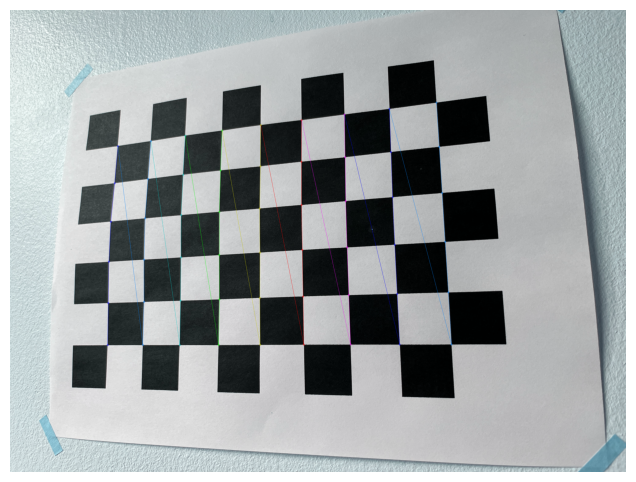

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1569.JPG


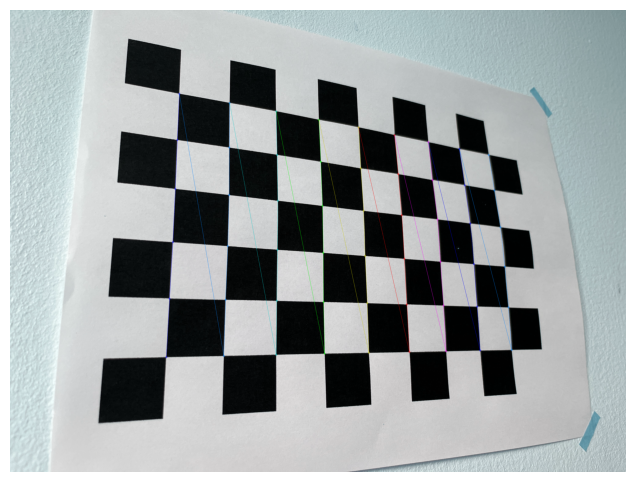

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1570.JPG


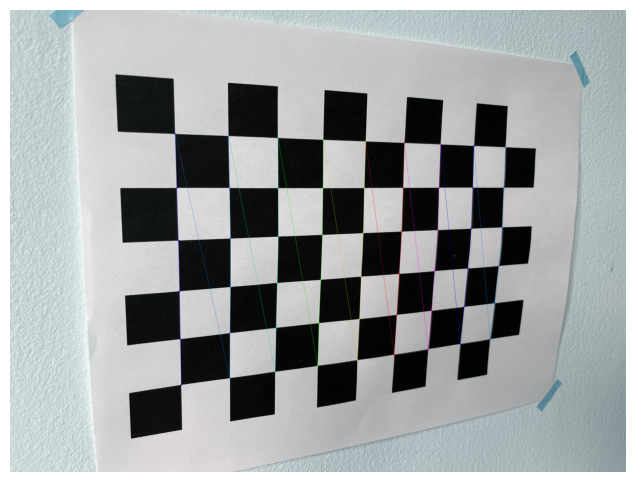

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1571.JPG


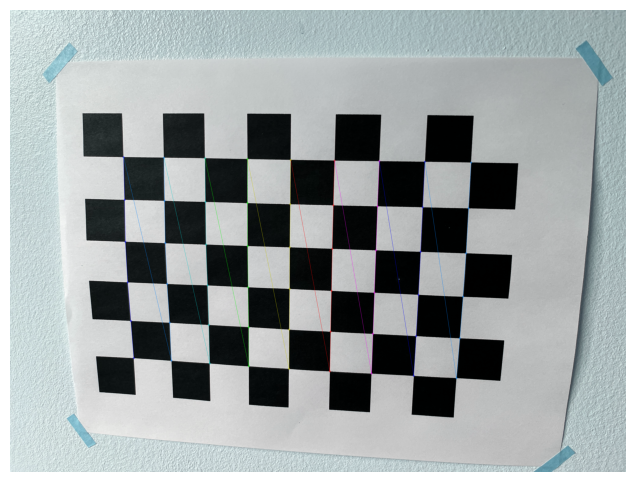

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1572.JPG


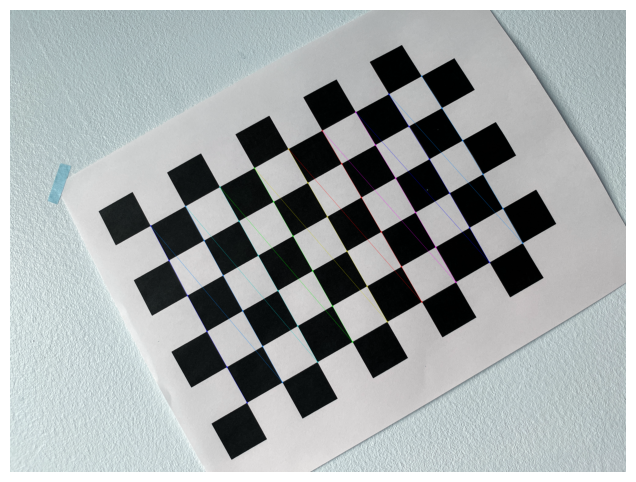

h:\Proyectos\UNAL\ComputerVision\taller_1_cv\imagenes\calibracion\IMG_1573.JPG


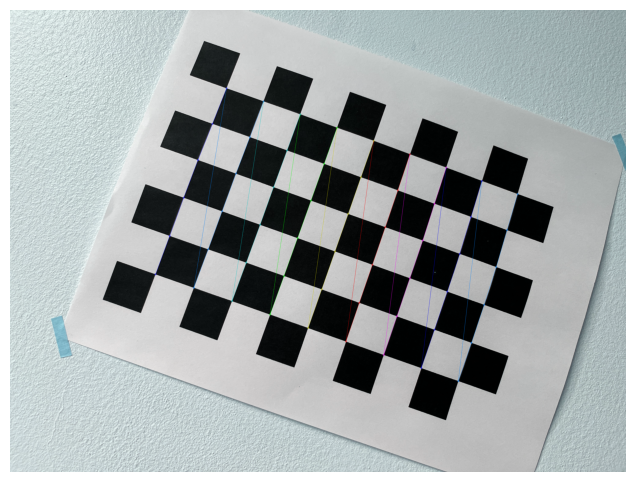

In [15]:
# Definir las dimensiones del tablero
CHECKERBOARD = (6, 9)


# Detener la iteración cuando se alcanza la precisión (epsilon) especificada
# o cuando se completa el número determinado de iteraciones
criteria = (cv2.TERM_CRITERIA_EPS +
            cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)


# Vector para los puntos 3D
threedpoints = []

# Vector para los puntos 2D
twodpoints = []

# Dimensión real del cuadro patrón (en mm)
square_size = 21.0


# Generar las coordenadas 3D de los puntos del tablero
objectp3d = np.zeros((1, CHECKERBOARD[0] * CHECKERBOARD[1], 3), np.float32)
objectp3d[0, :, :2] = np.mgrid[0:CHECKERBOARD[0],
                               0:CHECKERBOARD[1]].T.reshape(-1, 2)
objectp3d *= square_size
prev_img_shape = None


# Extraer la ruta de cada imagen almacenada

print("Imágenes encontradas:", len(images))


for filename in images:
    print(filename)
    image = cv2.imread(filename)
    grayColor = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Encontrar las esquinas del tablero de ajedrez
    # Si se encuentran el número deseado de esquinas
    # en la imagen, entonces ret = True
    ret, corners = cv2.findChessboardCorners(grayColor, CHECKERBOARD,
                    cv2.CALIB_CB_ADAPTIVE_THRESH+ cv2.CALIB_CB_FAST_CHECK +
                    cv2.CALIB_CB_NORMALIZE_IMAGE)

    # Si se detectan correctamente el número deseado de esquinas,
    # se refinan las coordenadas de píxel y se muestran
    # en las imágenes del tablero de ajedrez
    if ret == True:
        threedpoints.append(objectp3d)

        # Refinar las coordenadas de píxel
        # para los puntos 2D dados
        corners2 = cv2.cornerSubPix(grayColor, corners, (11, 11), (-1, -1), criteria)

        twodpoints.append(corners2)

        # Dibujar y mostrar las esquinas detectadas
        image = cv2.drawChessboardCorners(image, CHECKERBOARD,
                                          corners2, ret)


    # Mostrar resultados
    plt.figure(figsize=(10,6))
    plt.imshow(image)
    plt.axis("off")
    plt.show()

cv2.destroyAllWindows()

# Obtener las dimensiones de la imagen (alto y ancho)
h, w = image.shape[:2]

##Vectores de rotación y traslación

In [16]:
# Calibrar la cámara utilizando los puntos 3D del mundo real (threedpoints)
# y sus correspondientes puntos 2D detectados en las imágenes (twodpoints).
# La función devuelve:
#  - ret: valor booleano que indica si la calibración fue exitosa.
#  - matrix: matriz de parámetros intrínsecos de la cámara.
#  - distortion: coeficientes de distorsión óptica.
#  - r_vecs y t_vecs: vectores de rotación y traslación para cada imagen de calibración.
ret, matrix, distortion, r_vecs, t_vecs = cv2.calibrateCamera(
    threedpoints, twodpoints, grayColor.shape[::-1], None, None)

# Extraer los primeros cinco coeficientes de distorsión
k1, k2, p1, p2, k3 = distortion.ravel()[:5]

# Imprimir los vectores
print("\n Rotation Vectors:")
print(r_vecs)

print("\n Translation Vectors:")
print(t_vecs)



 Rotation Vectors:
(array([[-5.04269635e-02],
       [ 8.11179251e-04],
       [-1.56831397e+00]]), array([[-0.27800361],
       [ 0.1721027 ],
       [-1.52135175]]), array([[ 0.09658721],
       [-0.19871882],
       [-1.5441189 ]]), array([[-0.1940331 ],
       [-0.21796037],
       [-1.54993314]]), array([[ 0.12219858],
       [ 0.14208212],
       [-1.54671602]]), array([[ 0.28151314],
       [ 0.07657952],
       [-1.47486696]]), array([[ 0.05854013],
       [ 0.28519715],
       [-1.60734278]]), array([[-0.38719268],
       [ 0.11775683],
       [-1.59752257]]), array([[-0.38719268],
       [ 0.11775683],
       [-1.59752257]]), array([[ 0.03653112],
       [-0.36725494],
       [-1.54552074]]), array([[ 0.03653112],
       [-0.36725494],
       [-1.54552074]]), array([[ 0.14365296],
       [-0.20592918],
       [-1.55470182]]), array([[-0.14489166],
       [ 0.07790426],
       [-1.54998787]]), array([[-0.17913134],
       [-0.24550561],
       [-1.55242297]]), array([[ 0.1797

##Matriz de cámara K

In [18]:
print("\n Camera matrix:")
print(matrix)


 Camera matrix:
[[3.08144246e+03 0.00000000e+00 1.98429128e+03]
 [0.00000000e+00 3.09868118e+03 1.52475838e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]


##Coeficientes de distorsión

##¿La longitud focal fx es similar a fy?

En este caso, las longitudes focales fx y fy son muy similares, con valores 3081.44 y 3098.68, respectivamente.
La diferencia entre ellas es mínima (alrededor del 0.5 %), lo que indica que el sensor de la cámara tiene píxeles prácticamente cuadrados. (Kumar, 2025)

Sin embargo, no son exactamente iguales, y esta ligera diferencia se puede deber a varios factores:

*   Imprecisiones en el proceso de calibración, como errores en la detección de esquinas o ruido en las imágenes.
*   Diferencias físicas en el sensor, si los píxeles no son perfectamente cuadrados.
*   Pequeñas asimetrías ópticas del lente, que pueden alterar la proyección en uno de los ejes.


In [19]:
print(" Ret:")
print(ret)

print("\n Distortion coefficient:")
print(distortion)

print(f"k1 = {k1}")
print(f"k2 = {k2}")
print(f"p1 = {p1}")
print(f"p2 = {p2}")
print(f"k3 = {k3}")

 Ret:
3.547382352271375

 Distortion coefficient:
[[ 0.05127508 -0.50587408  0.00454172 -0.00282924  0.49092769]]
k1 = 0.05127508494998618
k2 = -0.5058740814114048
p1 = 0.004541722961365257
p2 = -0.002829242153457265
k3 = 0.49092769482345633


##Error de Re-projection (Error RMS)


In [20]:
mean_error = 0

for i in range(len(threedpoints)):
    proj_points, _ = cv2.projectPoints(threedpoints[i], r_vecs[i], t_vecs[i], matrix, distortion)
    error = cv2.norm(twodpoints[i], proj_points, cv2.NORM_L2)/len(proj_points)
    mean_error += error

print( "Re-projection Error: {}".format(mean_error/len(threedpoints)) )

Re-projection Error: 0.4705400710994104


##Imágenes originales vs. corregidas

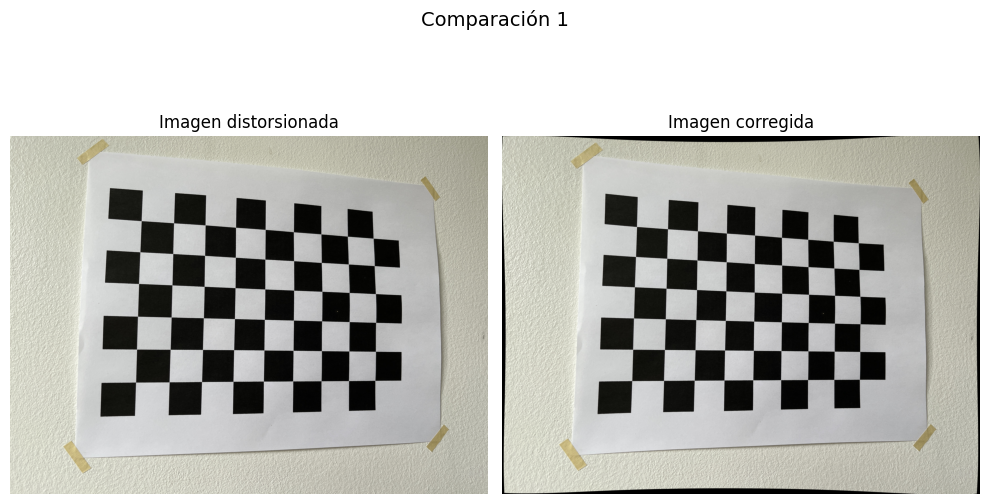

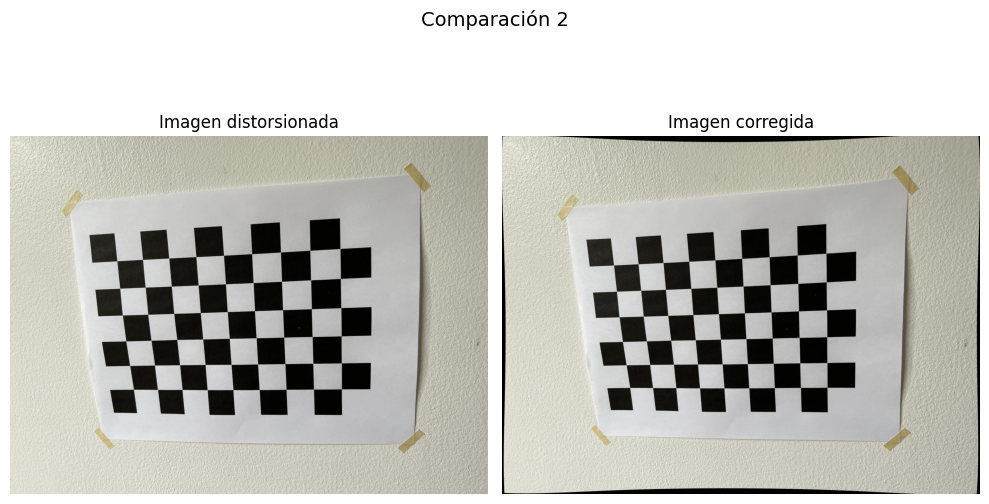

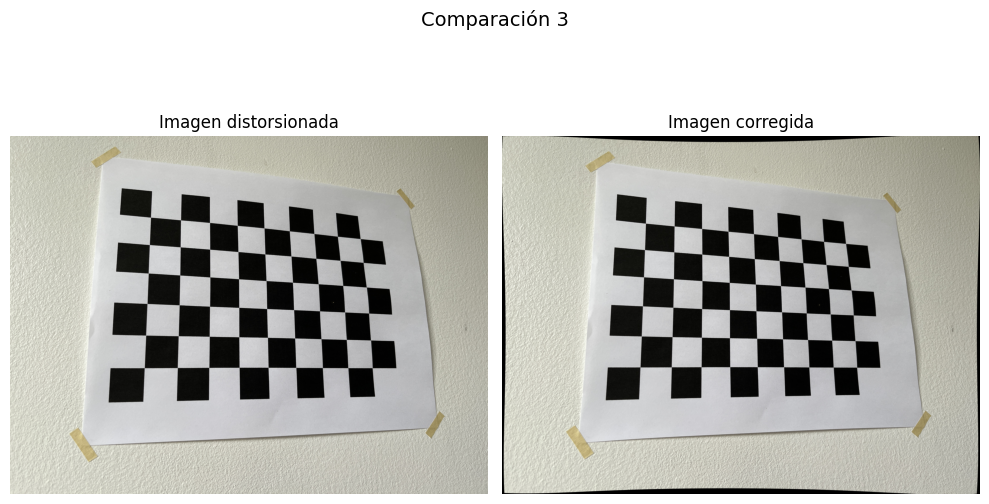

In [21]:
# Mostrar tres imágenes distorsionadas y sus versiones corregidas

# Seleccionar tres imágenes del conjunto
imagenes_seleccionadas = [images[2], images[6], images[10]]

# Recorrer las imágenes seleccionadas
for i, distorted_img_filename in enumerate(imagenes_seleccionadas):
    # Leer la imagen distorsionada
    distorted_image = cv2.imread(distorted_img_filename)

    # Refinar la matriz de la cámara
    # Devuelve la matriz óptima de la cámara y una región rectangular de interés (ROI)
    optimal_camera_matrix, roi = cv2.getOptimalNewCameraMatrix(matrix, distortion,
                                                              (w, h),
                                                              1,
                                                              (w, h))

    # Corregir la distorsión de la imagen usando los parámetros de calibración
    undistorted_image = cv2.undistort(distorted_image, matrix, distortion, None,
                                      optimal_camera_matrix)

    # Mostrar la imagen original y la corregida lado a lado
    plt.figure(figsize=(10, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(distorted_image, cv2.COLOR_BGR2RGB))
    plt.title("Imagen distorsionada")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(undistorted_image, cv2.COLOR_BGR2RGB))
    plt.title("Imagen corregida")
    plt.axis("off")

    plt.suptitle(f"Comparación {i+1}", fontsize=14)
    plt.tight_layout()
    plt.show()

# Cerrar todas las ventanas abiertas
cv2.destroyAllWindows()


##¿Qué tipo de distorsión predomina?

En las imágenes se observa una distorsión tipo cojín (pincushion distortion). Esto se evidencia principalmente en las esquinas, donde las líneas rectas parecen curvarse hacia el centro de la imagen, generando puntas en las esquinas. Este tipo de distorsión suele presentarse en lentes teleobjetivo o cuando se utilizan distancias focales grandes, lo que hace que los bordes de la imagen se compriman hacia el centro. (Passolas Fotografías, 2020)

In [22]:
cx = w / 2
cy = h / 2

print(f"\n Centro de la imagen: ({cx}, {cy})")
print(f"\n Punto principal: ({round(matrix[0][2],1)},{round(matrix[1][2],1)})")

#La distancia entre el centro y el punto principal
dif_x = cx - matrix[0][2]
dif_y = cy - matrix[1][2]
distancia = np.sqrt((dif_x)**2 + (dif_y)**2)

porcentaje_x = (dif_x / cx) * 100
porcentaje_y = (dif_y / cy) * 100

print()
print(f"\n Distancia entre el centro y el punto principal: {round(distancia,1)}")
print(f"\n Porcentaje en x: {porcentaje_x}%")
print(f"\n Porcentaje en y: {porcentaje_y}%")


 Centro de la imagen: (2016.0, 1512.0)

 Punto principal: (1984.3,1524.8)


 Distancia entre el centro y el punto principal: 34.2

 Porcentaje en x: 1.572853198149099%

 Porcentaje en y: -0.8438078968433056%


##¿El punto principal (cx, cy) está cerca del centro de la imagen?

Sí, el punto principal(cx,cy)=(1984.3,1524.8) está muy cerca del centro de la imagen (2016.0,1512.0).
La distancia entre ambos es de aproximadamente 34.2 píxeles, lo que representa solo 1.57 % en el eje x y –0.84 % en el eje y respecto al tamaño total de la imagen.

Esto indica que el punto principal se encuentra prácticamente centrado, lo cual es esperado en una calibración correcta, ya que pequeñas desviaciones son normales debido a ligeros desalineamientos del sensor o la lente.

#PUNTO 2

Implementar y comparar diferentes transformaciones de intensidad a nivel de píxel. Con un teléfono celular tomen dos fotografías de la fachada (puede ser de la casa de algún integrante del equipo) a las 6 am y a las 7 pm. Las fotografías deben ser desde el mismo punto. Sobre las fotografías ilustren las siguientes operaciones (implementadas a mano):

- Ajuste de brillo

- Ajuste de contraste

- Corrección gama

- Sumen (A+B), resten(A-B), multipliquen (A*B) y dividan (A/B) ambas fotografías.

In [27]:
"""
# Leer las dos imágenes desde Google Drive
img1 = cv2.imread('/content/drive/Shareddrives/NeuroVision/Taller1/imagenes/universidad/IMG_1618.JPG')
img2 = cv2.imread('/content/drive/Shareddrives/NeuroVision/Taller1/imagenes/universidad/IMG_1620.JPG')
"""

# Leer las dos imágenes en local
img1 = cv2.imread('./imagenes/universidad/IMG_1618.JPG')
img2 = cv2.imread('./imagenes/universidad/IMG_1620.JPG')

# Convertir de BGR (OpenCV) a RGB (Matplotlib)
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

##Ajuste de brillo

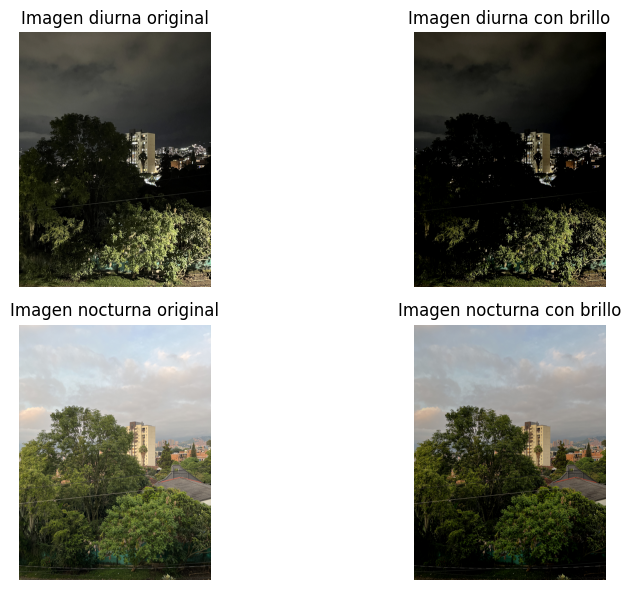

In [25]:
# Factor de brillo (positivo = más claro, negativo = más oscuro)
brillo = -40

# Creación de lienzos vacíos
out1_brillo = np.zeros_like(img1, dtype=np.uint8)
out2_brillo = np.zeros_like(img2, dtype=np.uint8)

# Recorrido píxel a píxel
for i in range(img1.shape[0]):          # filas
    for j in range(img1.shape[1]):      # columnas
        for c in range(img1.shape[2]):  # canales (R, G, B)
            #Se suma el brillo. Si es menor a 0 se toma el 0, si es mayor a 255, se toma 255
            new_val = int(img1[i, j, c]) + brillo
            out1_brillo[i, j, c] = max(0, min(255, new_val))
            new_val = int(img2[i, j, c]) + brillo
            out2_brillo[i, j, c] = max(0, min(255, new_val))


# Visualizar con Matplotlib
fig, axes = plt.subplots(2, 2, figsize=(10, 6))
axes[0, 0].imshow(img1)
axes[0, 0].set_title('Imagen diurna original')
axes[0, 1].imshow(out1_brillo)
axes[0, 1].set_title('Imagen diurna con brillo')


axes[1, 0].imshow(img2)
axes[1, 0].set_title('Imagen nocturna original')
axes[1, 1].imshow(out2_brillo)
axes[1, 1].set_title('Imagen nocturna con brillo')

for ax in axes.ravel():
    ax.axis('off')

plt.tight_layout()
plt.show()

##Ajuste de contraste

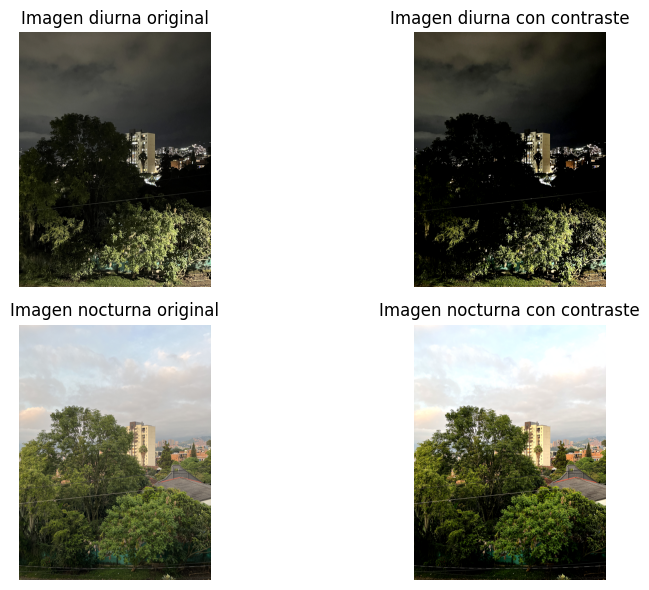

In [26]:
# Factor de contraste (1.0:igual, >1: gen. más contraste, <1: gen. menos contraste)
factor = 1.4

# Creación de lienzos vacíos
out1_contraste = np.zeros_like(img1, dtype=np.uint8)
out2_contraste = np.zeros_like(img2, dtype=np.uint8)

# Ajuste de contraste píxel a píxel
for i in range(img1.shape[0]):          # filas
    for j in range(img1.shape[1]):      # columnas
        for c in range(img1.shape[2]):  # canales (R, G, B)
            # Imagen 1
            new_val1 = factor * (int(img1[i, j, c]) - 128) + 128
            out1_contraste[i, j, c] = max(0, min(255, new_val1))

            # Imagen 2
            new_val2 = factor * (int(img2[i, j, c]) - 128) + 128
            out2_contraste[i, j, c] = max(0, min(255, new_val2))

# Visualización con matplotlib
fig, axes = plt.subplots(2, 2, figsize=(10, 6))
axes[0, 0].imshow(img1)
axes[0, 0].set_title('Imagen diurna original')
axes[0, 1].imshow(out1_contraste)
axes[0, 1].set_title('Imagen diurna con contraste')

axes[1, 0].imshow(img2)
axes[1, 0].set_title('Imagen nocturna original')
axes[1, 1].imshow(out2_contraste)
axes[1, 1].set_title('Imagen nocturna con contraste')

for ax in axes.ravel():
    ax.axis('off')

plt.tight_layout()
plt.show()

##Corrección gama

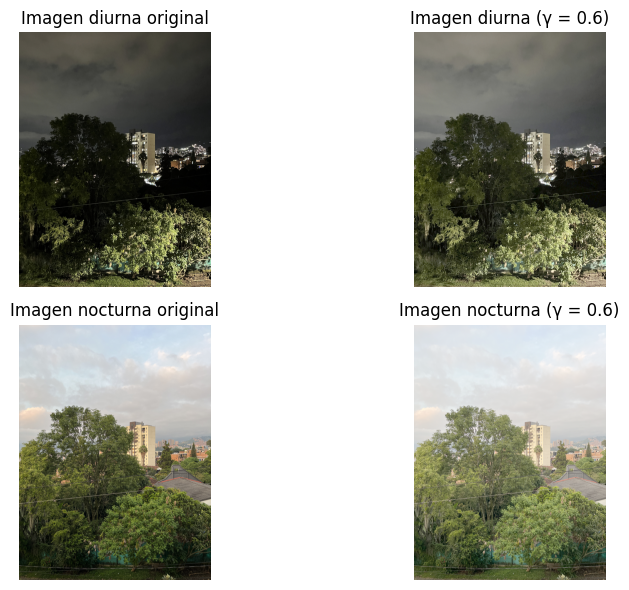

In [14]:
# Valor de gama (menor a 1 aclara, mayor a 1 oscurece)
gama = 0.6

# Creación de lienzos vacios
out1_gama = np.zeros_like(img1, dtype=np.uint8)
out2_gama = np.zeros_like(img2, dtype=np.uint8)

# Aplicar corrección gamma píxel a píxel
for i in range(img1.shape[0]):          # filas
    for j in range(img1.shape[1]):      # columnas
        for c in range(img1.shape[2]):  # canales (R, G, B)
            # Normalizar el valor del píxel (0–1)
            p1 = img1[i, j, c] / 255.0
            p2 = img2[i, j, c] / 255.0

            # Aplicar corrección gamma
            new_val1 = (p1 ** gama) * 255
            new_val2 = (p2 ** gama) * 255

            # Limitar valores con min/max (por seguridad)
            out1_gama[i, j, c] = max(0, min(255, new_val1))
            out2_gama[i, j, c] = max(0, min(255, new_val2))

# Visualizar resultados
fig, axes = plt.subplots(2, 2, figsize=(10, 6))
axes[0, 0].imshow(img1)
axes[0, 0].set_title('Imagen diurna original')
axes[0, 1].imshow(out1_gama)
axes[0, 1].set_title(f'Imagen diurna (γ = {gama})')

axes[1, 0].imshow(img2)
axes[1, 0].set_title('Imagen nocturna original')
axes[1, 1].imshow(out2_gama)
axes[1, 1].set_title(f'Imagen nocturna (γ = {gama})')

for ax in axes.ravel():
    ax.axis('off')

plt.tight_layout()
plt.show()


##Suma, resta, multiplicación, división

In [28]:
# Creación de lienzos vacíos
sum_img = np.zeros_like(img1, dtype=np.uint8)
res_img = np.zeros_like(img1, dtype=np.uint8)
mul_img = np.zeros_like(img1, dtype=np.uint8)
div_img = np.zeros_like(img1, dtype=np.uint8)

# Recorremos pixel a pixel
for i in range(img1.shape[0]):        # alto
    for j in range(img1.shape[1]):    # ancho
        for c in range(3):            # canales (R, G, B)

            # SUMA
            s = int(img1[i, j, c]) + int(img2[i, j, c])
            sum_img[i, j, c] = max(0, min(255, s))

            # RESTA
            r = int(img1[i, j, c]) - int(img2[i, j, c])
            res_img[i, j, c] = max(0, min(255, r))

            # MULTIPLICACIÓN
            m = (int(img1[i, j, c]) * int(img2[i, j, c])) / 255.0
            mul_img[i, j, c] = max(0, min(255, m))

            # DIVISIÓN
            if img2[i, j, c] != 0:
                d = (int(img1[i, j, c]) / int(img2[i, j, c])) * 255.0
            else:
                d = (int(img1[i, j, c])/ 1) * 255.0  # si el denominador es cero, fijamos a blanco(me genera la duda)
                div_img[i, j, c] = max(0, min(255, d))


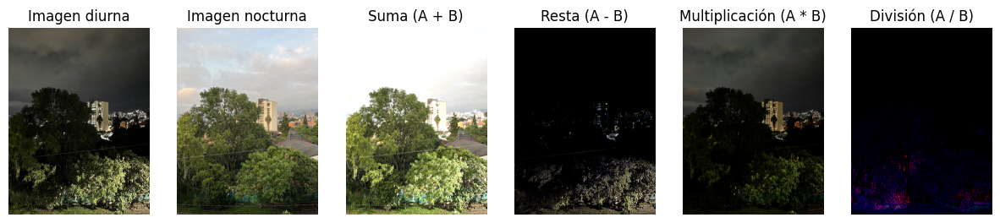

In [29]:
fig, axs = plt.subplots(1, 6, figsize=(15, 5))
axs[0].imshow(img1)
axs[0].set_title("Imagen diurna")
axs[1].imshow(img2)
axs[1].set_title("Imagen nocturna")
axs[2].imshow(sum_img)
axs[2].set_title("Suma (A + B)")
axs[3].imshow(res_img)
axs[3].set_title("Resta (A - B)")
axs[4].imshow(mul_img)
axs[4].set_title("Multiplicación (A * B)")
axs[5].imshow(div_img)
axs[5].set_title("División (A / B)")

for ax in axs:
    ax.axis('off')

plt.show()

# PUNTO 3
Creen una función que:


- Cargue una imagen
- Aplique 5-8 transformaciones sucesivas (traslaciones, rotaciones, escalas)
- Genere un GIF animado o video mostrando la secuencia
- Guarden cada frame intermedio

In [30]:
# Importar las librerías adicionales
from matplotlib import animation
from PIL import Image

##Transformaciones sucesivas

In [31]:
# Extraer la ruta de la image
"""img_path = '/content/drive/Shareddrives/NeuroVision/Taller1/imagenes/universidad/IMG_1592.JPG'"""
img_path = './imagenes/universidad/IMG_1592.JPG'
image = cv2.imread(img_path)

if image is None:
    raise FileNotFoundError("No se encontró la imagen en la ruta especificada.")

# Convertir a RGB (para mostrar correctamente con matplotlib)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Carpeta para guardar frames
frames_folder = "/content/drive/Shareddrives/NeuroVision/Taller1/frames_transformaciones"
os.makedirs(frames_folder, exist_ok=True)

# Función para aplicar transformaciones
def aplicar_transformaciones(img):
    filas, columnas, _ = img.shape
    frames = []

    # Transformación 1: Traslación
    M1 = np.float32([[1, 0, 50], [0, 1, 30]])
    t1 = cv2.warpAffine(img, M1, (columnas, filas))
    frames.append(t1)

    # Transformación 2: Rotación 15°
    M2 = cv2.getRotationMatrix2D((columnas/2, filas/2), 15, 1)
    t2 = cv2.warpAffine(t1, M2, (columnas, filas))
    frames.append(t2)

    # Transformación 3: Escalado (zoom out)
    t3 = cv2.resize(t2, None, fx=0.8, fy=0.8, interpolation=cv2.INTER_LINEAR)
    t3 = cv2.copyMakeBorder(t3, 50, 50, 50, 50, cv2.BORDER_CONSTANT, value=[0,0,0])
    frames.append(t3)

    # Transformación 4: Rotación -30°
    M4 = cv2.getRotationMatrix2D((columnas/2, filas/2), -30, 1)
    t4 = cv2.warpAffine(t3, M4, (columnas, filas))
    frames.append(t4)

    # Transformación 5: Traslación inversa
    M5 = np.float32([[1, 0, -50], [0, 1, -30]])
    t5 = cv2.warpAffine(t4, M5, (columnas, filas))
    frames.append(t5)

    # Transformación 6: Escalado (zoom in)
    t6 = cv2.resize(t5, None, fx=1.2, fy=1.2, interpolation=cv2.INTER_LINEAR)
    t6 = cv2.resize(t6, (columnas, filas))
    frames.append(t6)

    # Transformación 7: Rotación final 45°
    M7 = cv2.getRotationMatrix2D((columnas/2, filas/2), 45, 1)
    t7 = cv2.warpAffine(t6, M7, (columnas, filas))
    frames.append(t7)

    return frames

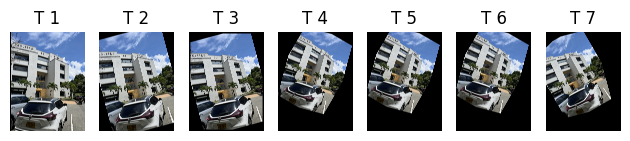

In [32]:
# Aplicar las transformaciones
frames = aplicar_transformaciones(image)

for i in range(7):
    plt.subplot(1, 7, i + 1)  # 1 fila, 6 columnas
    img_rgb = frames[i]
    plt.imshow(img_rgb)
    plt.title(f"T {i + 1}")
    plt.axis("off")

plt.tight_layout()
plt.show()

## GIF animado

In [33]:
# Aplicar transformaciones
frames = aplicar_transformaciones(image)

# Guardar frames intermedios
for i, frame in enumerate(frames):
    frame_path = os.path.join(frames_folder, f"frame_{i+1}.png")
    cv2.imwrite(frame_path, cv2.cvtColor(frame, cv2.COLOR_RGB2BGR))

# Crear GIF animado
gif_path = "/content/transformaciones.gif"
frames_pil = [Image.fromarray(f) for f in frames]
frames_pil[0].save(gif_path, save_all=True, append_images=frames_pil[1:], duration=400, loop=0)

print("Transformaciones aplicadas y GIF generado.")
print(f"GIF guardado en: {gif_path}")

# Animación en el notebook
fig, ax = plt.subplots(figsize=(6, 6))
ax.axis("off")
im = ax.imshow(frames[0])

def update(i):
    im.set_array(frames[i])
    ax.set_title(f"Transformación {i+1}")
    return [im]

ani = animation.FuncAnimation(fig, update, frames=len(frames), interval=500, blit=True)
plt.close()

from IPython.display import HTML
HTML(ani.to_jshtml())


Transformaciones aplicadas y GIF generado.
GIF guardado en: /content/transformaciones.gif


# PUNTO 4
Lleve a cabo la ecualización del histograma (usando la función de distribución acumulada) de las imágenes de la fachada del punto anterior.
- ¿Qué diferencias hay entre los histogramas de la imagen tomada de día y la imagen tomada de noche?
- ¿Cuáles son las transformaciones de ecualización en cada caso?

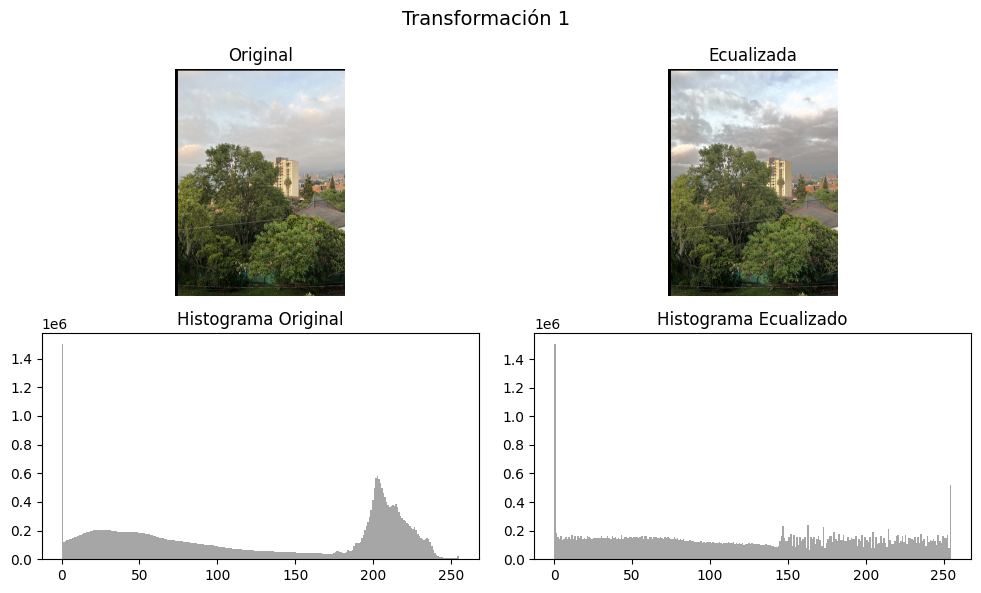

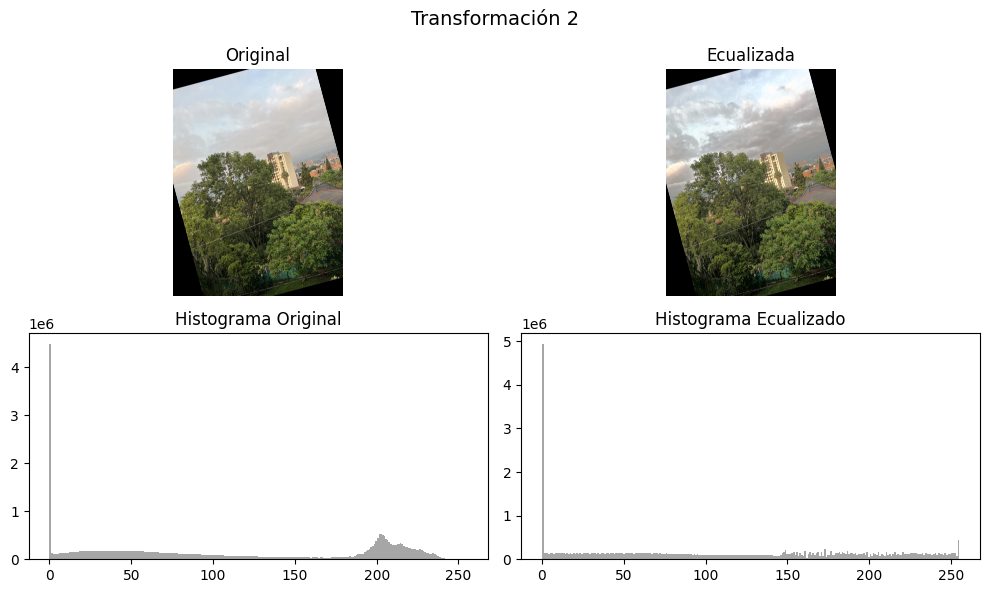

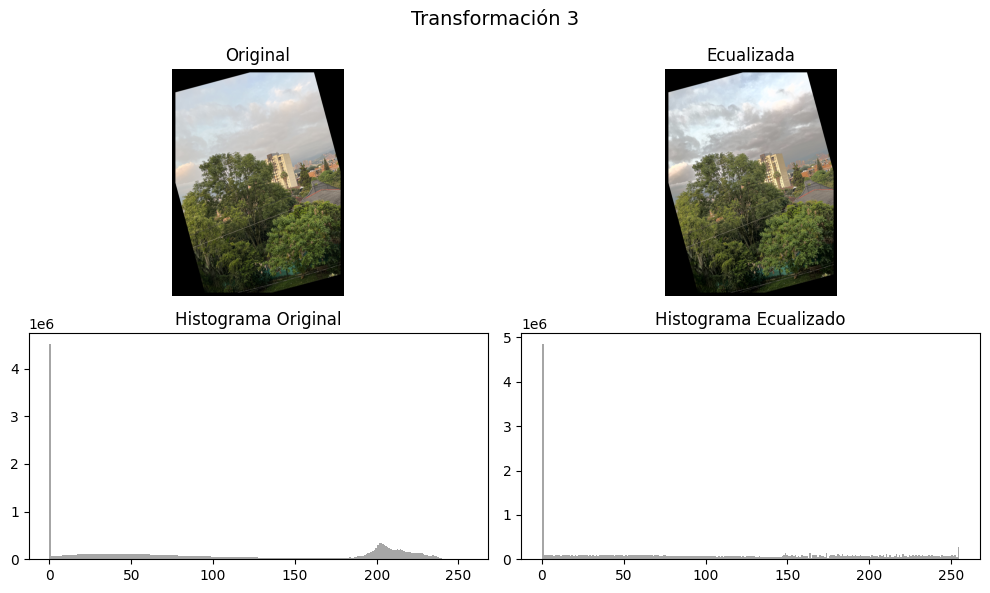

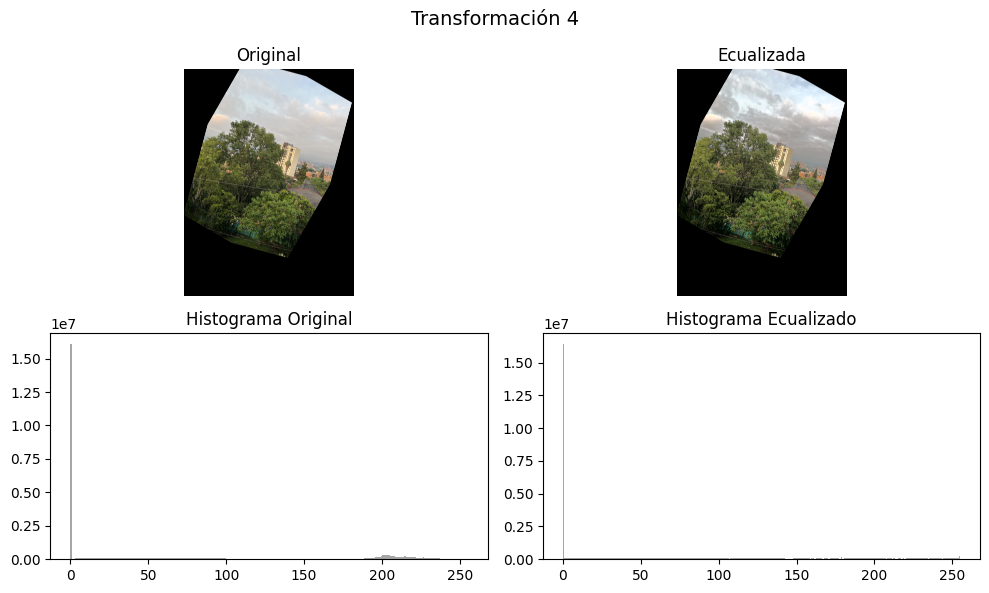

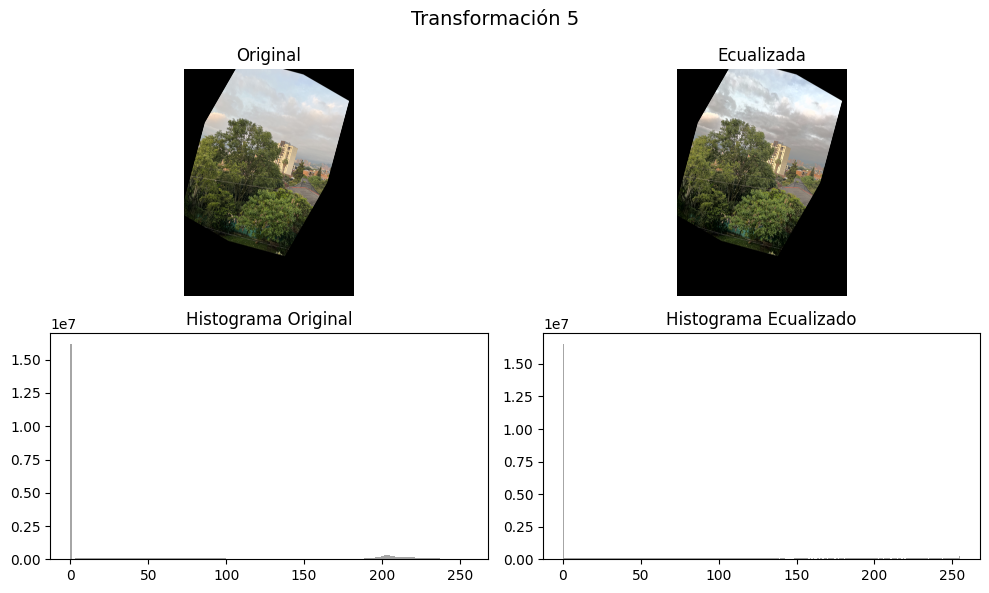

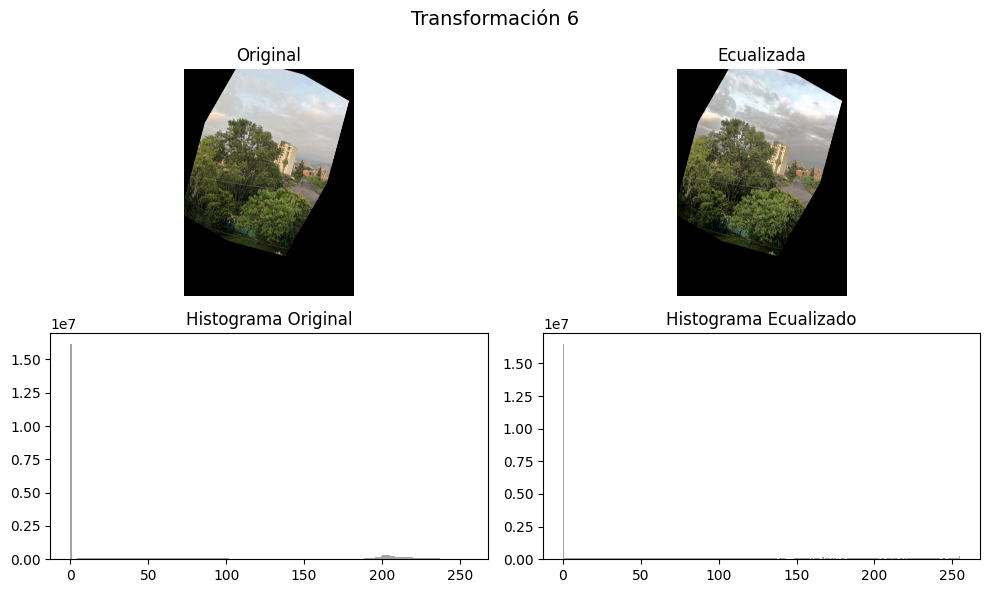

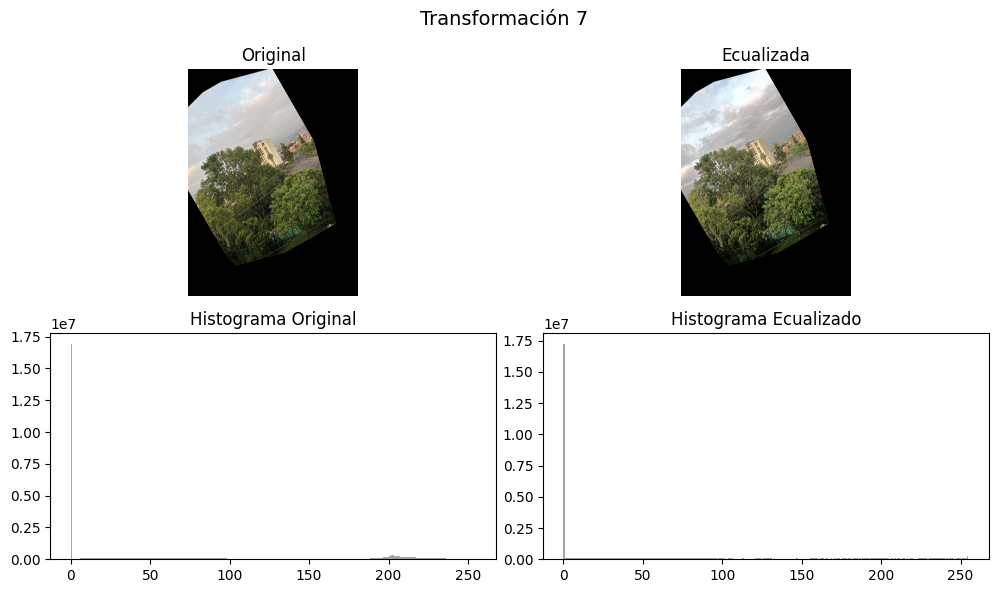

In [34]:
# Ruta de la imagen
"""img_path = '/content/drive/Shareddrives/NeuroVision/Taller1/imagenes/universidad/IMG_1620.JPG'"""
img_path = './imagenes/universidad/IMG_1620.JPG'
image = cv2.imread(img_path)

if image is None:
    raise FileNotFoundError("No se encontró la imagen en la ruta especificada.")

# Convertir a RGB para visualización correcta con matplotlib
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Carpeta para guardar frames
frames_folder = "/content/frames_transformaciones"
os.makedirs(frames_folder, exist_ok=True)

# Función para aplicar transformaciones
def aplicar_transformaciones(img):
    filas, columnas, _ = img.shape
    frames = []

    # Transformación 1: Traslación
    M1 = np.float32([[1, 0, 50], [0, 1, 30]])
    t1 = cv2.warpAffine(img, M1, (columnas, filas))
    frames.append(t1)

    # Transformación 2: Rotación 15°
    M2 = cv2.getRotationMatrix2D((columnas/2, filas/2), 15, 1)
    t2 = cv2.warpAffine(t1, M2, (columnas, filas))
    frames.append(t2)

    # Transformación 3: Escalado (zoom out)
    t3 = cv2.resize(t2, None, fx=0.8, fy=0.8, interpolation=cv2.INTER_LINEAR)
    t3 = cv2.copyMakeBorder(t3, 50, 50, 50, 50, cv2.BORDER_CONSTANT, value=[0,0,0])
    frames.append(t3)

    # Transformación 4: Rotación -30°
    M4 = cv2.getRotationMatrix2D((columnas/2, filas/2), -30, 1)
    t4 = cv2.warpAffine(t3, M4, (columnas, filas))
    frames.append(t4)

    # Transformación 5: Traslación inversa
    M5 = np.float32([[1, 0, -50], [0, 1, -30]])
    t5 = cv2.warpAffine(t4, M5, (columnas, filas))
    frames.append(t5)

    # Transformación 6: Escalado (zoom in)
    t6 = cv2.resize(t5, None, fx=1.2, fy=1.2, interpolation=cv2.INTER_LINEAR)
    t6 = cv2.resize(t6, (columnas, filas))
    frames.append(t6)

    # Transformación 7: Rotación final 45°
    M7 = cv2.getRotationMatrix2D((columnas/2, filas/2), 45, 1)
    t7 = cv2.warpAffine(t6, M7, (columnas, filas))
    frames.append(t7)

    return frames

#  Aplicar transformaciones
frames = aplicar_transformaciones(image)

# Ecualizar cada frame y mostrar histogramas
for i, frame in enumerate(frames):
    # Convertir a YUV y ecualizar solo el canal Y
    yuv = cv2.cvtColor(frame, cv2.COLOR_RGB2YUV)
    yuv[:,:,0] = cv2.equalizeHist(yuv[:,:,0])
    ecualizada = cv2.cvtColor(yuv, cv2.COLOR_YUV2RGB)

    # Guardar imagen ecualizada
    frame_path = os.path.join(frames_folder, f"frame_{i+1}_ecualizada.png")
    cv2.imwrite(frame_path, cv2.cvtColor(ecualizada, cv2.COLOR_RGB2BGR))

    # Mostrar imagen original vs ecualizada y sus histogramas
    fig, axes = plt.subplots(2, 2, figsize=(10, 6))
    fig.suptitle(f"Transformación {i+1}", fontsize=14)

    # Imagen original
    axes[0,0].imshow(frame)
    axes[0,0].set_title("Original")
    axes[0,0].axis("off")

    # Imagen ecualizada
    axes[0,1].imshow(ecualizada)
    axes[0,1].set_title("Ecualizada")
    axes[0,1].axis("off")

    # Histograma original
    axes[1,0].hist(frame.ravel(), bins=256, color='gray', alpha=0.7)
    axes[1,0].set_title("Histograma Original")

    # Histograma ecualizado
    axes[1,1].hist(ecualizada.ravel(), bins=256, color='gray', alpha=0.7)
    axes[1,1].set_title("Histograma Ecualizado")

    plt.tight_layout()
    plt.show()

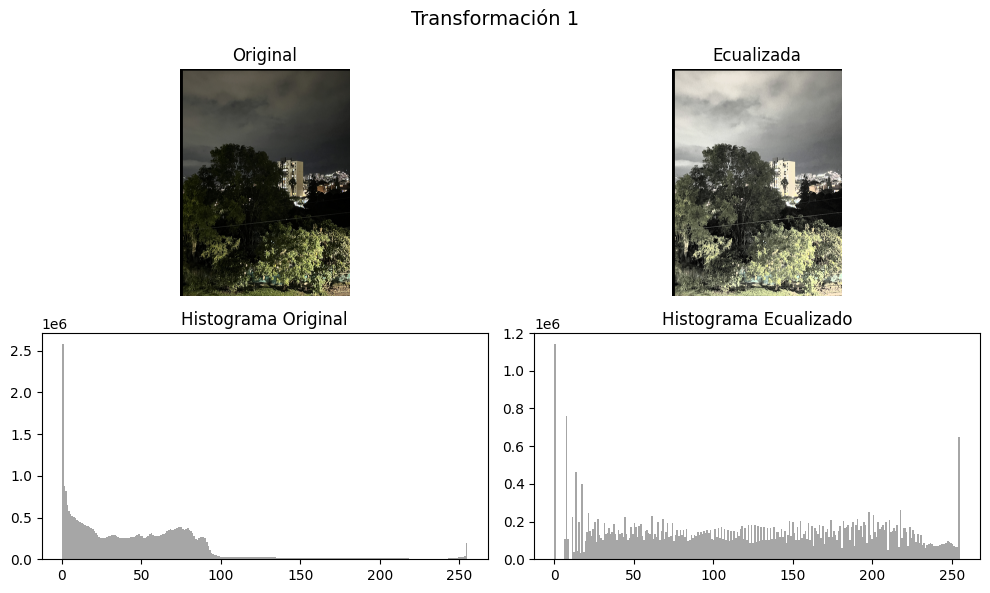

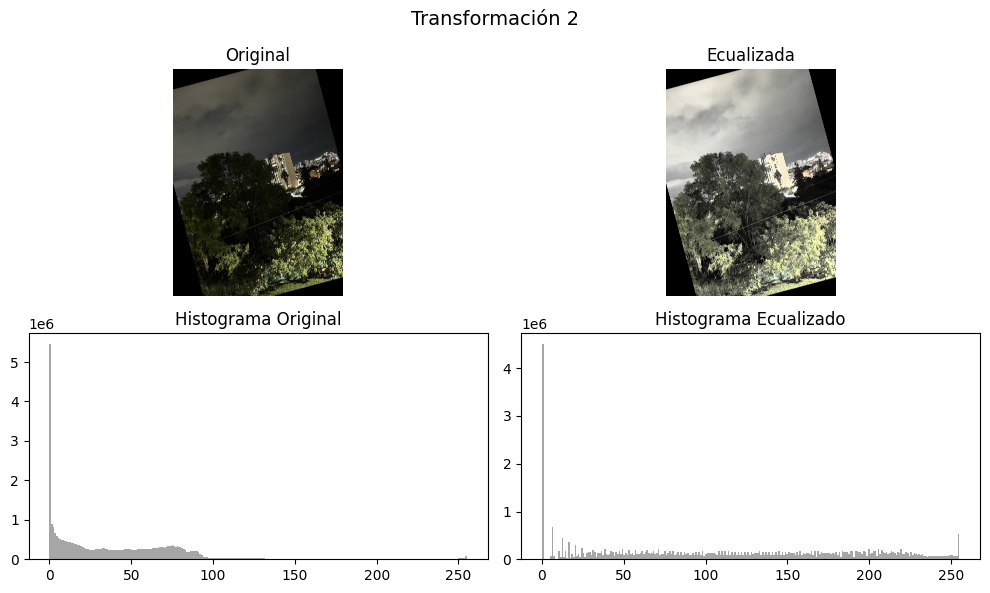

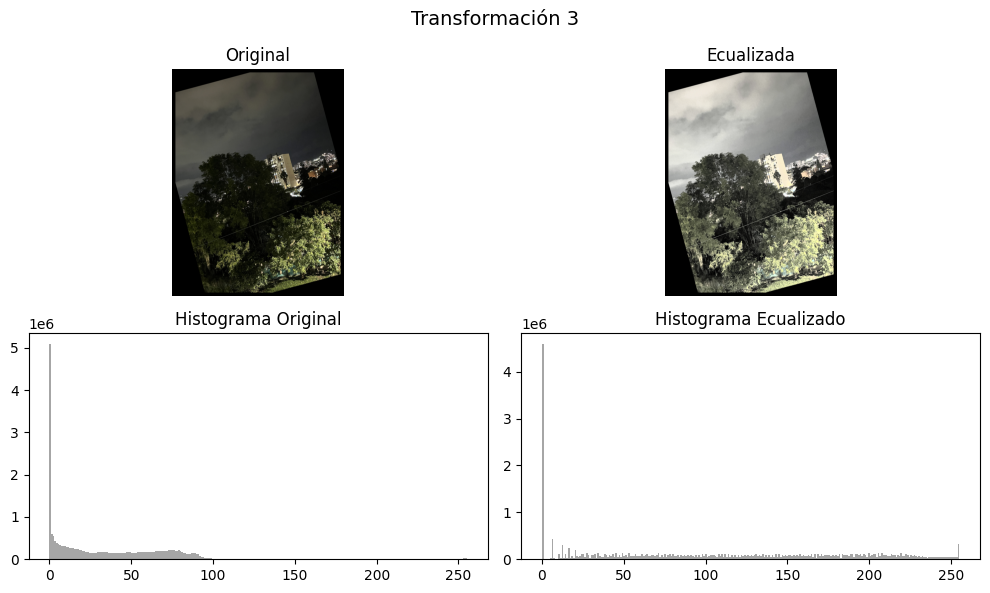

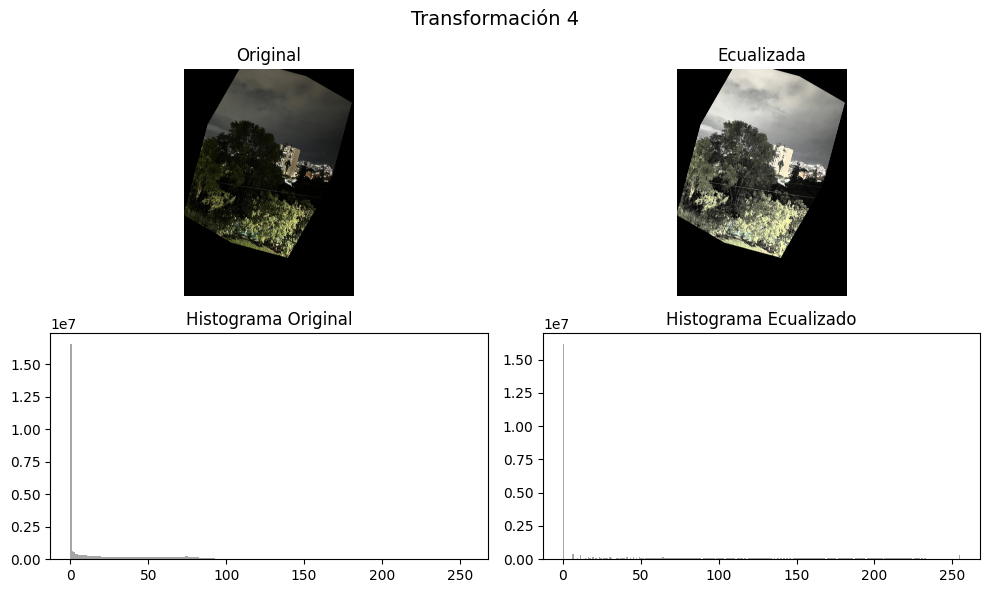

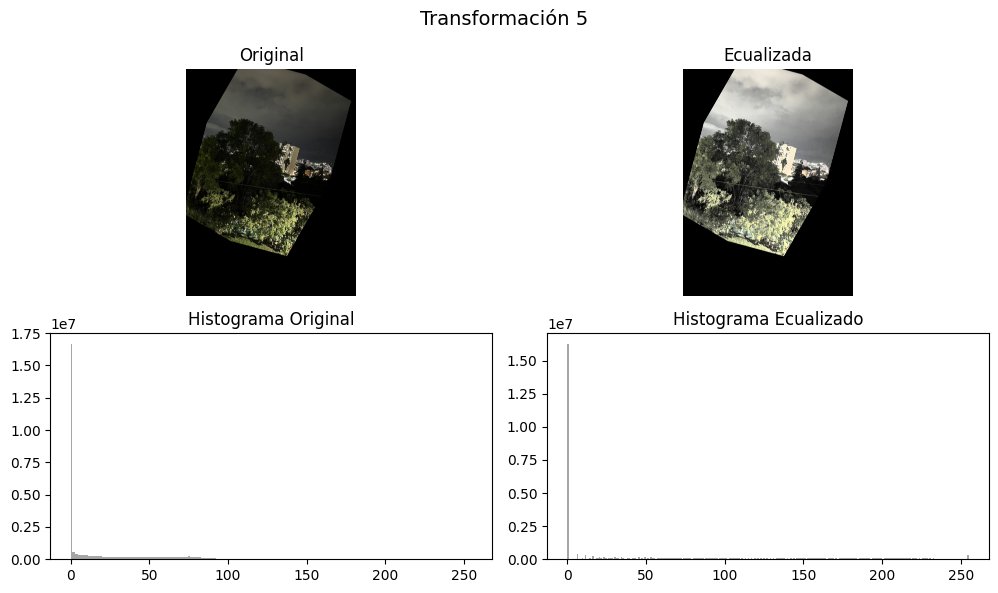

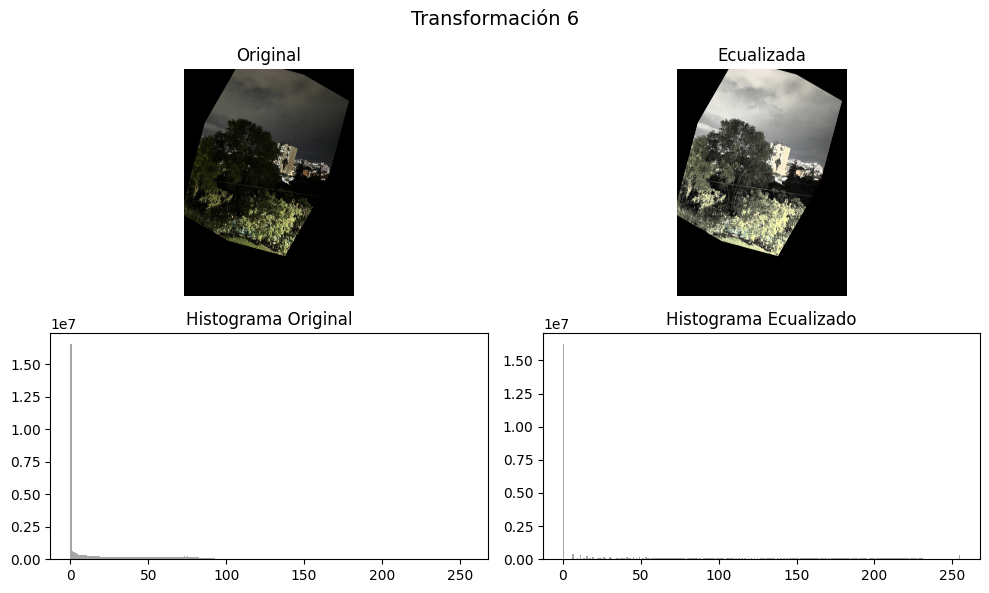

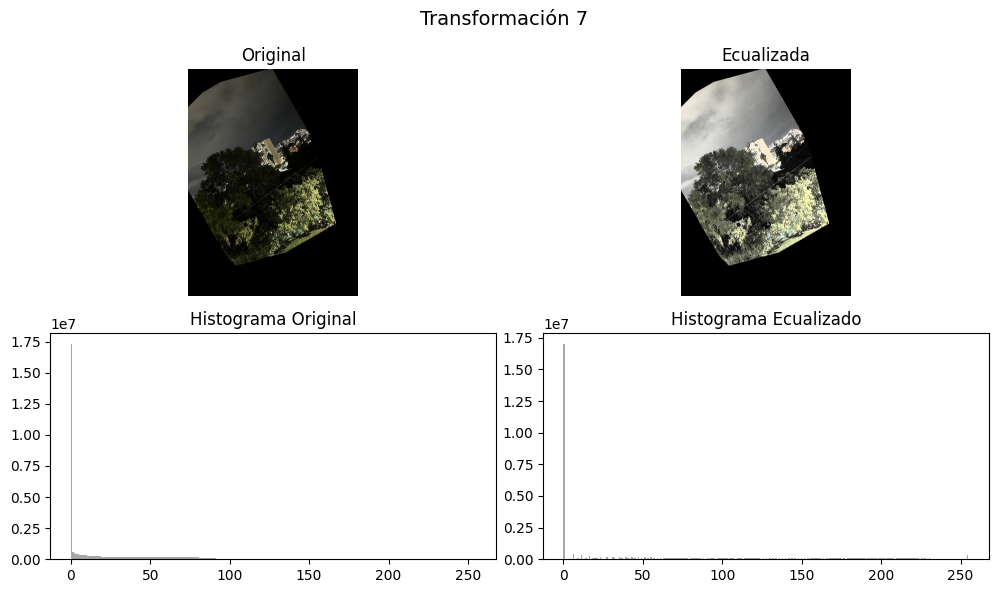

In [37]:
# Ruta de la imagen
"""img_path = '/content/drive/Shareddrives/NeuroVision/Taller1/imagenes/universidad/IMG_1618.JPG'"""
img_path = './imagenes/universidad/IMG_1618.JPG'
image = cv2.imread(img_path)

if image is None:
    raise FileNotFoundError("No se encontró la imagen en la ruta especificada.")

# Convertir a RGB para visualización correcta con matplotlib
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Carpeta para guardar frames
"""frames_folder = '/content/frames_transformaciones'"""
frames_folder = "./frames_transformaciones"
os.makedirs(frames_folder, exist_ok=True)

# Función para aplicar transformaciones
def aplicar_transformaciones(img):
    filas, columnas, _ = img.shape
    frames = []

    # Transformación 1: Traslación
    M1 = np.float32([[1, 0, 50], [0, 1, 30]])
    t1 = cv2.warpAffine(img, M1, (columnas, filas))
    frames.append(t1)

    # Transformación 2: Rotación 15°
    M2 = cv2.getRotationMatrix2D((columnas/2, filas/2), 15, 1)
    t2 = cv2.warpAffine(t1, M2, (columnas, filas))
    frames.append(t2)

    # Transformación 3: Escalado (zoom out)
    t3 = cv2.resize(t2, None, fx=0.8, fy=0.8, interpolation=cv2.INTER_LINEAR)
    t3 = cv2.copyMakeBorder(t3, 50, 50, 50, 50, cv2.BORDER_CONSTANT, value=[0,0,0])
    frames.append(t3)

    # Transformación 4: Rotación -30°
    M4 = cv2.getRotationMatrix2D((columnas/2, filas/2), -30, 1)
    t4 = cv2.warpAffine(t3, M4, (columnas, filas))
    frames.append(t4)

    # Transformación 5: Traslación inversa
    M5 = np.float32([[1, 0, -50], [0, 1, -30]])
    t5 = cv2.warpAffine(t4, M5, (columnas, filas))
    frames.append(t5)

    # Transformación 6: Escalado (zoom in)
    t6 = cv2.resize(t5, None, fx=1.2, fy=1.2, interpolation=cv2.INTER_LINEAR)
    t6 = cv2.resize(t6, (columnas, filas))
    frames.append(t6)

    # Transformación 7: Rotación final 45°
    M7 = cv2.getRotationMatrix2D((columnas/2, filas/2), 45, 1)
    t7 = cv2.warpAffine(t6, M7, (columnas, filas))
    frames.append(t7)

    return frames


# Aplicar transformaciones
frames = aplicar_transformaciones(image)

# Ecualizar cada frame y mostrar histogramas
for i, frame in enumerate(frames):
    # Convertir a YUV y ecualizar solo el canal Y
    yuv = cv2.cvtColor(frame, cv2.COLOR_RGB2YUV)
    yuv[:,:,0] = cv2.equalizeHist(yuv[:,:,0])
    ecualizada = cv2.cvtColor(yuv, cv2.COLOR_YUV2RGB)

    # Guardar imagen ecualizada
    frame_path = os.path.join(frames_folder, f"frame_{i+1}_ecualizada.png")
    cv2.imwrite(frame_path, cv2.cvtColor(ecualizada, cv2.COLOR_RGB2BGR))

    # Mostrar imagen original vs ecualizada y sus histogramas
    fig, axes = plt.subplots(2, 2, figsize=(10, 6))
    fig.suptitle(f"Transformación {i+1}", fontsize=14)

    # Imagen original
    axes[0,0].imshow(frame)
    axes[0,0].set_title("Original")
    axes[0,0].axis("off")

    # Imagen ecualizada
    axes[0,1].imshow(ecualizada)
    axes[0,1].set_title("Ecualizada")
    axes[0,1].axis("off")

    # Histograma original
    axes[1,0].hist(frame.ravel(), bins=256, color='gray', alpha=0.7)
    axes[1,0].set_title("Histograma Original")

    # Histograma ecualizado
    axes[1,1].hist(ecualizada.ravel(), bins=256, color='gray', alpha=0.7)
    axes[1,1].set_title("Histograma Ecualizado")

    plt.tight_layout()
    plt.show()

##¿Qué diferencias hay entre los histogramas de la imagen tomada de día y la imagen tomada de noche?

La principal diferencia entre los histogramas de la imagen tomada de día y la tomada de noche está en cómo se distribuyen los valores de intensidad. En la imagen diurna, el histograma se concentra en las zonas de brillo alto (valores cercanos a 255), lo que refleja una escena muy iluminada con predominio de tonos claros, como el cielo y las fachadas. En cambio, en la imagen nocturna los valores se agrupan en el rango bajo (entre 0 y 80), indicando una iluminación tenue y predominio de sombras. Tras aplicar la ecualización, ambos histogramas se vuelven mucho más uniformes y cubren todo el rango tonal, lo que significa que los contrastes se equilibran y los detalles se hacen más visibles tanto en las áreas oscuras como en las claras; en otras palabras, la ecualización empareja los tonos y mejora el contraste general de las imágenes.


##¿Cuáles son las transformaciones de ecualización en cada caso?
En la imagen tomada de día, la ecualización actúa reduciendo el exceso de brillo y redistribuyendo las intensidades hacia valores medios, lo que permite recuperar detalles en las zonas sobreexpuestas y mejorar el contraste general. En cambio, en la imagen tomada de noche, la transformación de ecualización expande los valores de intensidad desde las zonas oscuras hacia todo el rango tonal, aclarando las sombras y haciendo más visibles los elementos que antes se perdían por la falta de luz. En ambos casos, el resultado es un histograma más uniforme y una imagen con mejor equilibrio entre luces y sombras.

Además, en algunas de las imágenes transformadas se observa una gran cantidad de píxeles con intensidad 0. Esto ocurre porque al aplicar rotaciones, traslaciones o escalados, se generan áreas vacías que se rellenan con color negro. Esos valores aumentan el pico en el extremo izquierdo del histograma, pero no representan información real de la imagen, sino zonas fuera del área útil. En general, la ecualización tiende a distribuir los tonos de manera más pareja, equilibrando la luminosidad y mejorando el contraste general en ambas condiciones de iluminación.

# PUNTO 5
Capturen una escena con objetos de colores distintos de la Universidad Nacional o de la oficina de alguno de los integrantes del equipo. Debe ser con una cámara de un teléfono celular.
- Segmenten cada objeto por su color
- Cuenten cuántos objetos de cada color hay
- Calculen el área de cada objeto

In [38]:
"""img = cv2.imread("/content/drive/Shareddrives/NeuroVision/Taller1/imagenes/universidad/IMG_1594.JPG")"""
img = cv2.imread("./imagenes/universidad/IMG_1594.JPG")

In [39]:
def mostrar_imagenes(*imagenes, titulos=None, filas=1, cmap=None):
    n = len(imagenes)
    columnas = -(-n // filas)
    plt.figure(figsize=(5 * columnas, 4 * filas))

    for i, img in enumerate(imagenes):
        plt.subplot(filas, columnas, i + 1)
        if len(img.shape) == 2:
            plt.imshow(img)
        else:
            plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        if titulos and i < len(titulos):
            plt.title(titulos[i])
        plt.axis("off")
    plt.tight_layout()
    plt.show()
def segmentar_por_color(img, lower_bound, upper_bound):

    # Convertir a HSV
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Convertir límites a arrays si son listas
    lower = np.array(lower_bound)
    upper = np.array(upper_bound)

    # Crear máscara binaria
    mascara = cv2.inRange(hsv, lower, upper)

    #Suavizado
    mascara_blur = cv2.GaussianBlur(mascara, (5, 5), 0)

    # Aplicar máscara a la imagen original
    objeto_segmentado = cv2.bitwise_and(img, img, mask=mascara)

    return mascara_blur, objeto_segmentado


def contar_objetos(mascara, area_min=50):
    # Buscar contornos
    contornos, _ = cv2.findContours(mascara, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Filtrar contornos pequeños
    contornos_filtrados = [c for c in contornos if cv2.contourArea(c) >= area_min]

    return len(contornos_filtrados), contornos_filtrados

def segmentar_por_canny(img, t1=100, t2=200, suavizar=True, ksize=5):

    gris = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    if suavizar:
        gris = cv2.GaussianBlur(gris, (ksize, ksize), 0)

    bordes = cv2.Canny(gris, t1, t2)

    return bordes
def cerrar_bordes(bordes, kernel_size=3):
    kernel = np.ones((kernel_size, kernel_size), np.uint8)
    mascara = cv2.dilate(bordes, kernel, iterations=1)
    mascara = cv2.morphologyEx(mascara, cv2.MORPH_CLOSE, kernel)
    mascara = cv2.erode(mascara, kernel, iterations=1)
    return mascara

##Segmentación por color

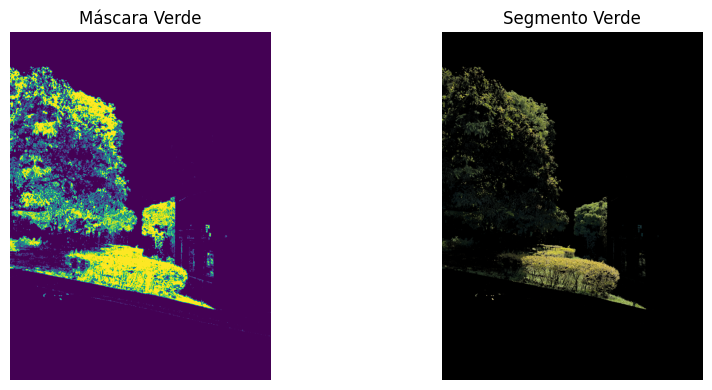

In [40]:
# Verde
# Rangos de color
lower = [22, 54, 0]
upper = [95, 255, 255]

mascara_verde, segmento_verde = segmentar_por_color(img, lower, upper)

mostrar_imagenes(mascara_verde, segmento_verde, titulos=["Máscara Verde", "Segmento Verde"])

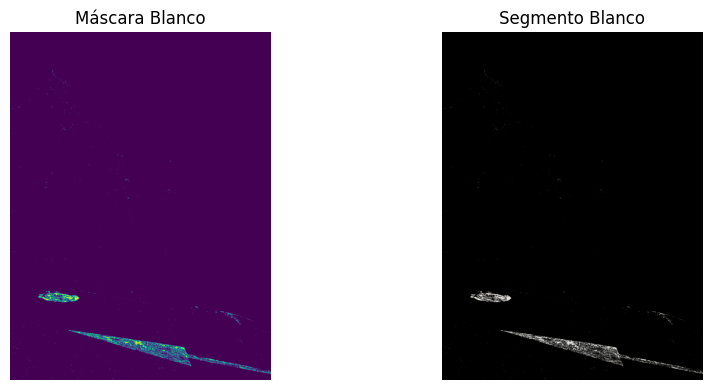

In [41]:
# Blanco
lower = [0, 0, 225]
upper = [30, 12, 255]

mascara_blanco, segmento_blanco = segmentar_por_color(img, lower, upper)

mostrar_imagenes(mascara_blanco, segmento_blanco, titulos=["Máscara Blanco", "Segmento Blanco"])

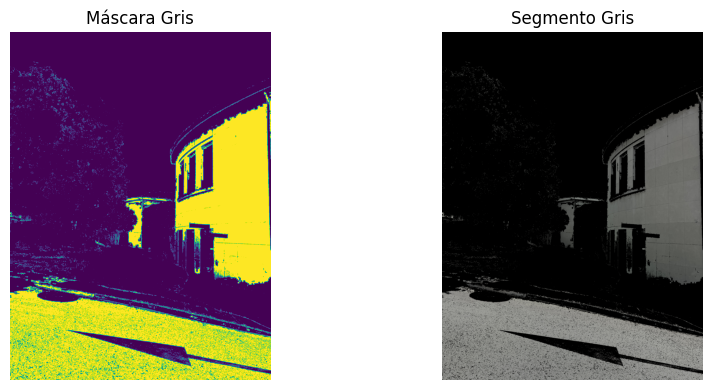

In [42]:
# Gris edificio
lower = [0, 0, 46]
upper = [79, 17, 180]

mascara_gris, segmento_gris = segmentar_por_color(img, lower, upper)

mostrar_imagenes(mascara_gris, segmento_gris, titulos=["Máscara Gris", "Segmento Gris"])


##Número de objetos y área de cada objeto

Número de objetos detectados: 25
Objeto 1: área = 143.00 píxeles²
Objeto 2: área = 408.50 píxeles²
Objeto 3: área = 3239.00 píxeles²
Objeto 4: área = 397.00 píxeles²
Objeto 5: área = 180.50 píxeles²
Objeto 6: área = 355.50 píxeles²
Objeto 7: área = 116.00 píxeles²
Objeto 8: área = 109.00 píxeles²
Objeto 9: área = 124.00 píxeles²
Objeto 10: área = 828.50 píxeles²
Objeto 11: área = 430.50 píxeles²
Objeto 12: área = 589.00 píxeles²
Objeto 13: área = 101.50 píxeles²
Objeto 14: área = 1000.00 píxeles²
Objeto 15: área = 996.50 píxeles²
Objeto 16: área = 155.00 píxeles²
Objeto 17: área = 9737.00 píxeles²
Objeto 18: área = 8565.00 píxeles²
Objeto 19: área = 881.00 píxeles²
Objeto 20: área = 275.50 píxeles²
Objeto 21: área = 106.00 píxeles²
Objeto 22: área = 912.00 píxeles²
Objeto 23: área = 250.50 píxeles²
Objeto 24: área = 879.00 píxeles²
Objeto 25: área = 6056.50 píxeles²


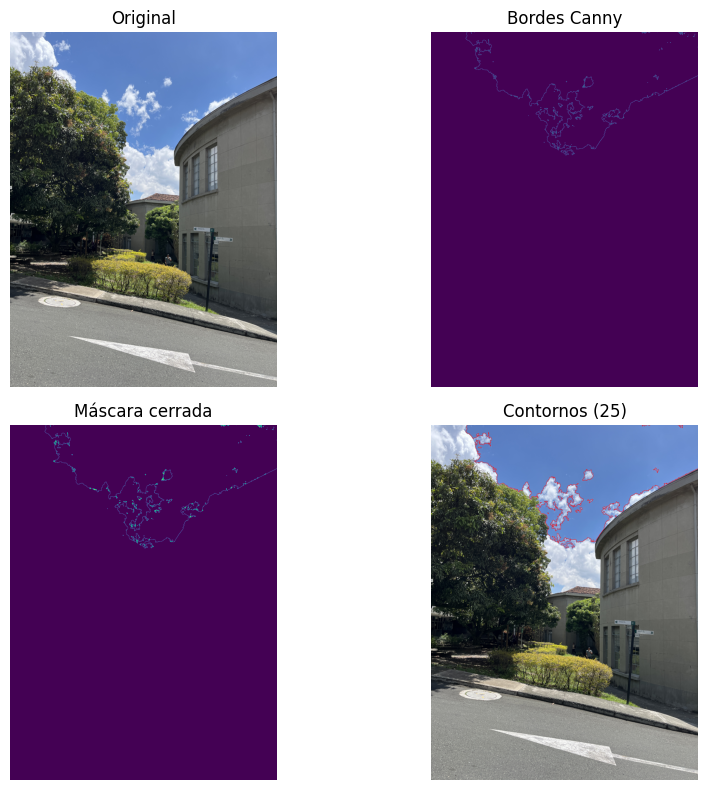

In [43]:
#Azul
lower = [97, 120, 130]
upper = [130, 255, 255]

mascara_azul, segmento_azul = segmentar_por_color(img, lower, upper)

#mostrar_imagenes(mascara_azul, segmento_azul, titulos=["Máscara Azul", "Segmento Azul"])

# Detectar bordes con Canny
bordes = segmentar_por_canny(segmento_azul, t1=80, t2=180, suavizar=True, ksize=5)

# Cerrar bordes para obtener máscaras sólidas
mascara = cerrar_bordes(bordes, kernel_size=3)

# Contar objetos
total, contornos = contar_objetos(mascara, area_min=100)
print(f"Número de objetos detectados: {total}")

# Calcular y mostrar el área de cada objeto detectado
for i, c in enumerate(contornos):
    area = cv2.contourArea(c)
    print(f"Objeto {i+1}: área = {area:.2f} píxeles²")

# Dibujar contornos
img_contornos = img.copy()
cv2.drawContours(img_contornos, contornos, -1, (0, 0, 255), 2)

# Visualizar
mostrar_imagenes(
    img,
    bordes,
    mascara,
    img_contornos,
    titulos=["Original", "Bordes Canny", "Máscara cerrada", f"Contornos ({total})"],
    filas=2
)

#Referencias bibliográficas

Passolas Fotografías. (2020, enero 11). DISTORSIONES DE LENTE, que son y como solucionarlas. Adobe LightRoom [Video]. YouTube. https://www.youtube.com/watch?v=vVW2EeL-uQQ


Kumar, P. (2025, enero 29). A Comprehensive Guide to Understand Camera Projection and Parameters. e-con Systems. https://www.e-consystems.com/blog/camera/technology/a-comprehensive-guide-to-understand-camera-projection-and-parameters/

#Reporte de contribución individual

Punto 1: Yuricik Cañas Quintero y Jorge Alexander Orrego Puerta

Punto 2: Yuricik Cañas Quitero

Punto 3: Thomas Agudelo Londono

Punto 4: Juan Jose Munoz Restrepo

Punto 5: Jorge Alexander Orrego Puerta y Juan Jose Munoz Restrepo

Revisión: Yuricik Cañas Quintero y Juan Jose Munoz Restrepo
